In [1]:
import torch
import numpy as np
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report

from scarches.dataset.trvae.data_handling import remove_sparsity
from lataq.models import EMBEDCVAE
from lataq.exp_dict import EXPERIMENT_INFO

sc.settings.set_figure_params(dpi=200, frameon=False)
sc.set_figure_params(dpi=500)
plt.rcParams['figure.figsize'] = (5, 5)
torch.set_printoptions(precision=3, sci_mode=False, edgeitems=7)

%load_ext autoreload
%autoreload 2

In [2]:
PARAMS = {
    'EPOCHS': 100,                                      #TOTAL TRAINING EPOCHS
    'N_PRE_EPOCHS': 80,                                #EPOCHS OF PRETRAINING WITHOUT LANDMARK LOSS
    'DATA_DIR': '../../lataq_reproduce/data',          #DIRECTORY WHERE THE DATA IS STORED
    'DATA': 'pancreas',                                #DATA USED FOR THE EXPERIMENT
    'EARLY_STOPPING_KWARGS': {                         #KWARGS FOR EARLY STOPPING
        "early_stopping_metric": "val_landmark_loss",  ####value used for early stopping
        "mode": "min",                                 ####choose if look for min or max
        "threshold": 0,
        "patience": 20,
        "reduce_lr": True,
        "lr_patience": 13,
        "lr_factor": 0.1,
    },
    'LABELED_LOSS_METRIC': 'dist',           
    'UNLABELED_LOSS_METRIC': 'dist',
    'LATENT_DIM': 25,
    'ALPHA_EPOCH_ANNEAL': 1e6,
    'CLUSTERING_RES': 2,
    'HIDDEN_LAYERS': 3,
    'ETA': 10,
}

In [3]:
EXP_PARAMS = EXPERIMENT_INFO[PARAMS['DATA']]
adata = sc.read(
    f'{PARAMS["DATA_DIR"]}/{EXP_PARAMS["file_name"]}'
)
condition_key = EXP_PARAMS['condition_key']
cell_type_key = EXP_PARAMS['cell_type_key']
reference = EXP_PARAMS['reference']
query = EXP_PARAMS['query']
adata.obs['query'] = adata.obs[condition_key].isin(query)
adata.obs['query'] = adata.obs['query'].astype('category')
source_adata = adata[adata.obs.study.isin(reference)].copy()
target_adata = adata[adata.obs.study.isin(query)].copy()

In [4]:
lataq_model = EMBEDCVAE(
    adata=source_adata,
    condition_key=condition_key,
    cell_type_keys=cell_type_key,
    hidden_layer_sizes=[128]*int(PARAMS['HIDDEN_LAYERS']),
    latent_dim=PARAMS['LATENT_DIM'],
)

Embedding dictionary:
 	Num conditions: 7
 	Embedding dim: 10
Encoder Architecture:
	Input Layer in, out and cond: 4000 128 0
	Hidden Layer 1 in/out: 128 128
	Hidden Layer 2 in/out: 128 128
	Mean/Var Layer in/out: 128 25
Decoder Architecture:
	First Layer in, out and cond:  25 128 10
	Hidden Layer 1 in/out: 128 128
	Hidden Layer 2 in/out: 128 128
	Output Layer in/out:  128 4000 



In [5]:
lataq_model.train(
    n_epochs=PARAMS['EPOCHS'],
    pretraining_epochs=PARAMS['N_PRE_EPOCHS'],
    early_stopping_kwargs=PARAMS['EARLY_STOPPING_KWARGS'],
    alpha_epoch_anneal=PARAMS['ALPHA_EPOCH_ANNEAL'],
    eta=PARAMS['ETA'],
    clustering_res=PARAMS['CLUSTERING_RES'],
    labeled_loss_metric=PARAMS['LABELED_LOSS_METRIC'],
    unlabeled_loss_metric=PARAMS['UNLABELED_LOSS_METRIC'],
    weight_decay=0
)

 |████████████████████| 100.0%  - val_loss: 964.1878995028 - val_trvae_loss: 947.6926047585 - val_landmark_loss: 16.4952984290 - val_labeled_loss: 1.6495298391
Saving best state of network...
Best State was in Epoch 92


In [6]:
lataq_model.save('pancreas/', overwrite=True)

In [7]:
lataq_query = EMBEDCVAE.load_query_data(
    adata=target_adata,
    reference_model='pancreas/',
    labeled_indices=[],
)

AnnData object with n_obs × n_vars = 3289 × 4000
    obs: 'study', 'cell_type', 'pred_label', 'pred_score', 'query'
    obsm: 'X_seurat', 'X_symphony'
Embedding dictionary:
 	Num conditions: 9
 	Embedding dim: 10
Encoder Architecture:
	Input Layer in, out and cond: 4000 128 0
	Hidden Layer 1 in/out: 128 128
	Hidden Layer 2 in/out: 128 128
	Mean/Var Layer in/out: 128 25
Decoder Architecture:
	First Layer in, out and cond:  25 128 10
	Hidden Layer 1 in/out: 128 128
	Hidden Layer 2 in/out: 128 128
	Output Layer in/out:  128 4000 

7


In [8]:
lataq_query.train(
    n_epochs=PARAMS['EPOCHS'],
    early_stopping_kwargs=PARAMS['EARLY_STOPPING_KWARGS'],
    alpha_epoch_anneal=PARAMS['ALPHA_EPOCH_ANNEAL'],
    pretraining_epochs=PARAMS['N_PRE_EPOCHS'],
    clustering_res=PARAMS['CLUSTERING_RES'],
    eta=PARAMS['ETA'],
    labeled_loss_metric=PARAMS['LABELED_LOSS_METRIC'],
    unlabeled_loss_metric=PARAMS['UNLABELED_LOSS_METRIC'],
    weight_decay=0
)

 |████████████████----| 80.0%  - val_loss: 1740.4635009766 - val_trvae_loss: 1740.4635009766
Initializing unlabeled landmarks with Leiden-Clustering with an unknown number of clusters.
Leiden Clustering succesful. Found 24 clusters.
 |████████████████████| 100.0%  - val_loss: 1719.3669026693 - val_trvae_loss: 1719.2849934896 - val_landmark_loss: 0.0819123723 - val_unlabeled_loss: 8.1912368139
Saving best state of network...
Best State was in Epoch 84


In [9]:
lataq_query.save('pancreas_wquery/', overwrite=True)

In [10]:
results_dict = lataq_query.classify(
    adata.X, 
    adata.obs[condition_key], 
    metric=PARAMS['LABELED_LOSS_METRIC'],
)
for i in range(len(cell_type_key)):
    preds = results_dict[cell_type_key[i]]['preds']
    probs = results_dict[cell_type_key[i]]['probs']
    classification_df = pd.DataFrame(
        classification_report(
            y_true=adata.obs[cell_type_key[i]], 
            y_pred=preds,
            output_dict=True
        )
    ).transpose()

/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y, hue. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


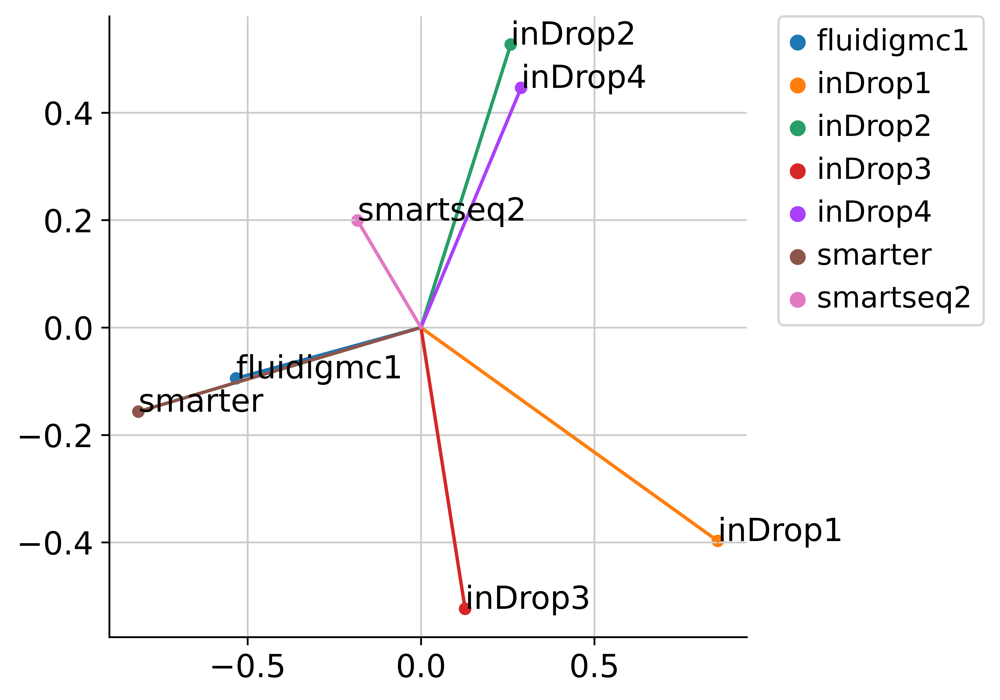

In [11]:
embedding = lataq_model.model.embedding.weight.detach().cpu().numpy()
from sklearn.decomposition import KernelPCA
pca = KernelPCA(n_components=2, kernel='cosine')
emb_pca = pca.fit_transform(embedding)

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
import seaborn as sns
sns.scatterplot(emb_pca[:, 0], emb_pca[:, 1], source_adata.obs[condition_key].unique(), ax=ax)
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
for i, c in enumerate(source_adata.obs[condition_key].unique()):
    ax.plot([0, emb_pca[i, 0]], [0, emb_pca[i, 1]])
    ax.text(emb_pca[i, 0], emb_pca[i, 1], c)
sns.despine()

In [12]:
from sklearn.metrics.pairwise import cosine_similarity
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
sns.heatmap(
    cosine_similarity(embedding), 
    cmap='RdBu', 
    annot=True, 
    fmt='.2f',
    ax=ax,
    vmin=-1,
    vmax=1,
)
ax.set_xticklabels(lataq_model.conditions_, rotation=90)
ax.set_yticklabels(lataq_model.conditions_, rotation=0)

[Text(0, 0.5, 'fluidigmc1'),
 Text(0, 1.5, 'inDrop1'),
 Text(0, 2.5, 'inDrop2'),
 Text(0, 3.5, 'inDrop3'),
 Text(0, 4.5, 'inDrop4'),
 Text(0, 5.5, 'smarter'),
 Text(0, 6.5, 'smartseq2')]

/home/icb/carlo.dedonno/anaconda3/envs/lataq_cuda/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y, hue. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


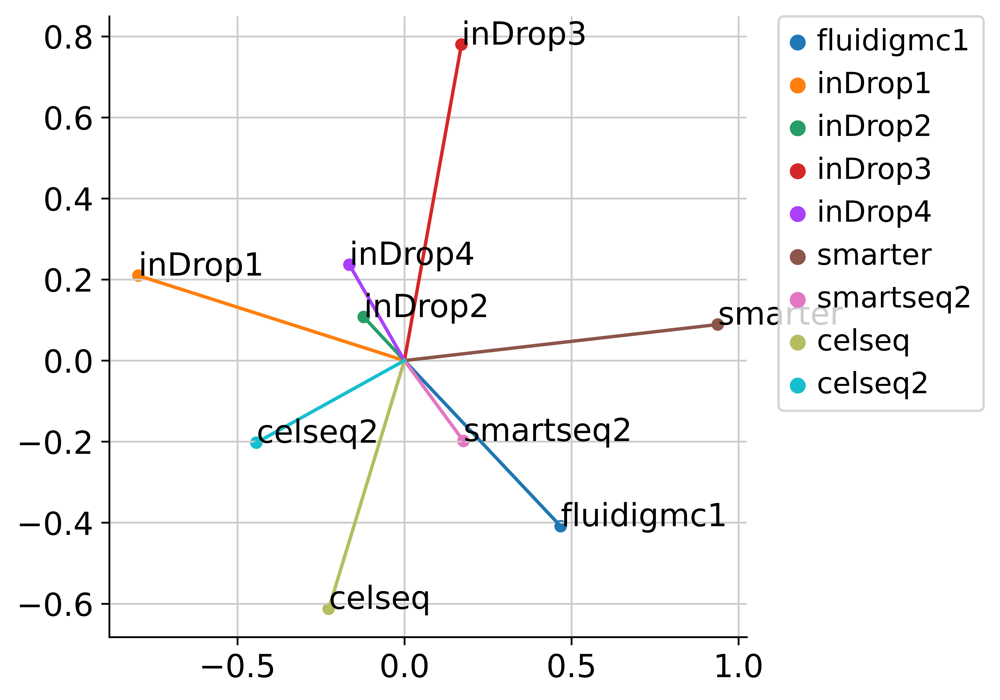

In [13]:
embedding = lataq_query.model.embedding.weight.detach().cpu().numpy()
from sklearn.decomposition import KernelPCA
pca = KernelPCA(n_components=2, kernel='cosine')
emb_pca = pca.fit_transform(embedding)
conditions = lataq_query.conditions_
fig, ax = plt.subplots(1, 1, figsize=(5, 5))
sns.scatterplot(emb_pca[:, 0], emb_pca[:, 1], conditions, ax=ax)
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
for i, c in enumerate(conditions):
    ax.plot([0, emb_pca[i, 0]], [0, emb_pca[i, 1]])
    ax.text(emb_pca[i, 0], emb_pca[i, 1], c)
sns.despine()

In [14]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
sns.heatmap(
    cosine_similarity(embedding), 
    cmap='RdBu', 
    annot=True, 
    fmt='.2f',
    ax=ax,
    vmin=-1,
    vmax=1,
)
ax.set_xticklabels(lataq_query.conditions_, rotation=90)
ax.set_yticklabels(lataq_query.conditions_, rotation=0)

[Text(0, 0.5, 'fluidigmc1'),
 Text(0, 1.5, 'inDrop1'),
 Text(0, 2.5, 'inDrop2'),
 Text(0, 3.5, 'inDrop3'),
 Text(0, 4.5, 'inDrop4'),
 Text(0, 5.5, 'smarter'),
 Text(0, 6.5, 'smartseq2'),
 Text(0, 7.5, 'celseq'),
 Text(0, 8.5, 'celseq2')]

In [26]:
data_latent = lataq_query.get_latent(
    source_adata.X, 
    source_adata.obs[condition_key].values
)
adata_latent = sc.AnnData(data_latent)
adata_latent.obs['batch'] = source_adata.obs[condition_key].tolist()
results_dict = lataq_query.classify(
    source_adata.X, 
    source_adata.obs[condition_key], 
    metric='dist'
)
print(results_dict)
sc.pp.neighbors(adata_latent)
sc.tl.umap(adata_latent)
sc.pl.umap(adata_latent, color='batch')

{'cell_type': {'preds': array(['gamma', 'gamma', 'gamma', 'gamma', 'gamma', 'gamma', 'gamma', ...,
       'epsilon', 'quiescent_stellate', 'quiescent_stellate',
       'quiescent_stellate', 'quiescent_stellate', 'quiescent_stellate',
       'quiescent_stellate'], dtype='<U18'), 'probs': array([0.94, 0.94, 0.94, 0.94, 0.94, 0.94, 0.93, ..., 0.89, 0.64, 0.68,
       0.73, 0.74, 0.73, 0.73], dtype=float32)}}


KeyboardInterrupt: 

{'cell_type': {'preds': array(['gamma', 'gamma', 'gamma', 'gamma', 'gamma', 'gamma', 'gamma', ...,
       'activated_stellate', 'activated_stellate', 'quiescent_stellate',
       'activated_stellate', 'quiescent_stellate', 'activated_stellate',
       'quiescent_stellate'], dtype='<U18'), 'probs': array([0.94, 0.94, 0.94, 0.94, 0.94, 0.94, 0.93, ..., 0.79, 0.74, 0.72,
       0.79, 0.76, 0.7 , 0.66], dtype=float32)}}


... storing 'batch' as categorical


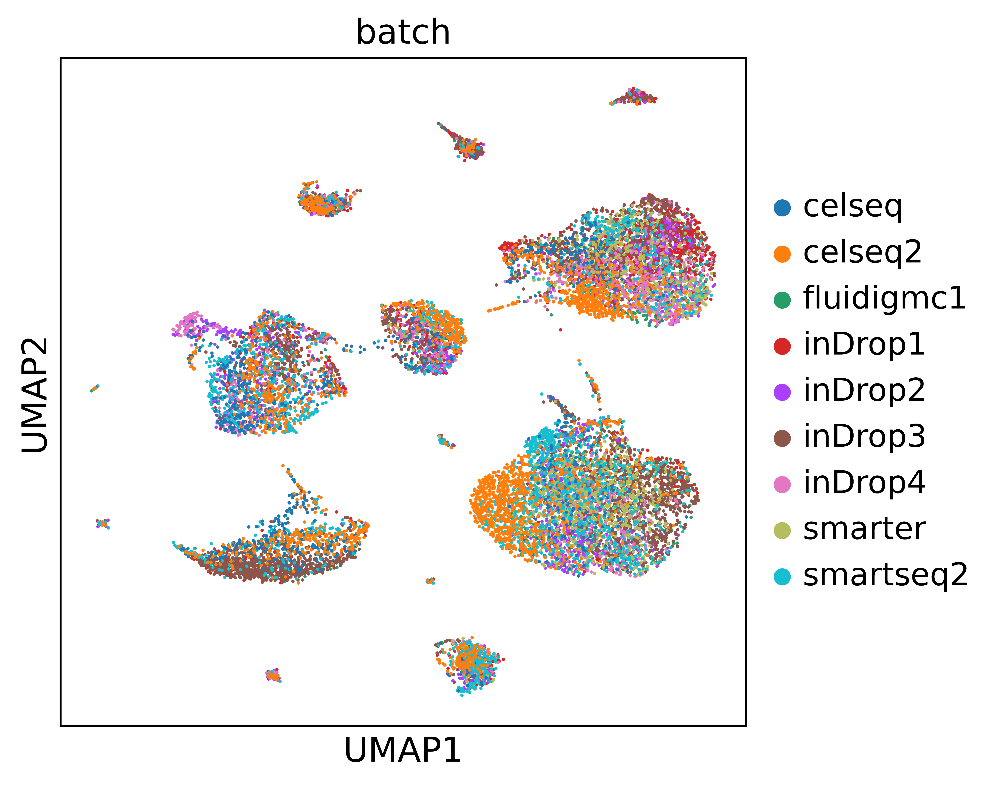

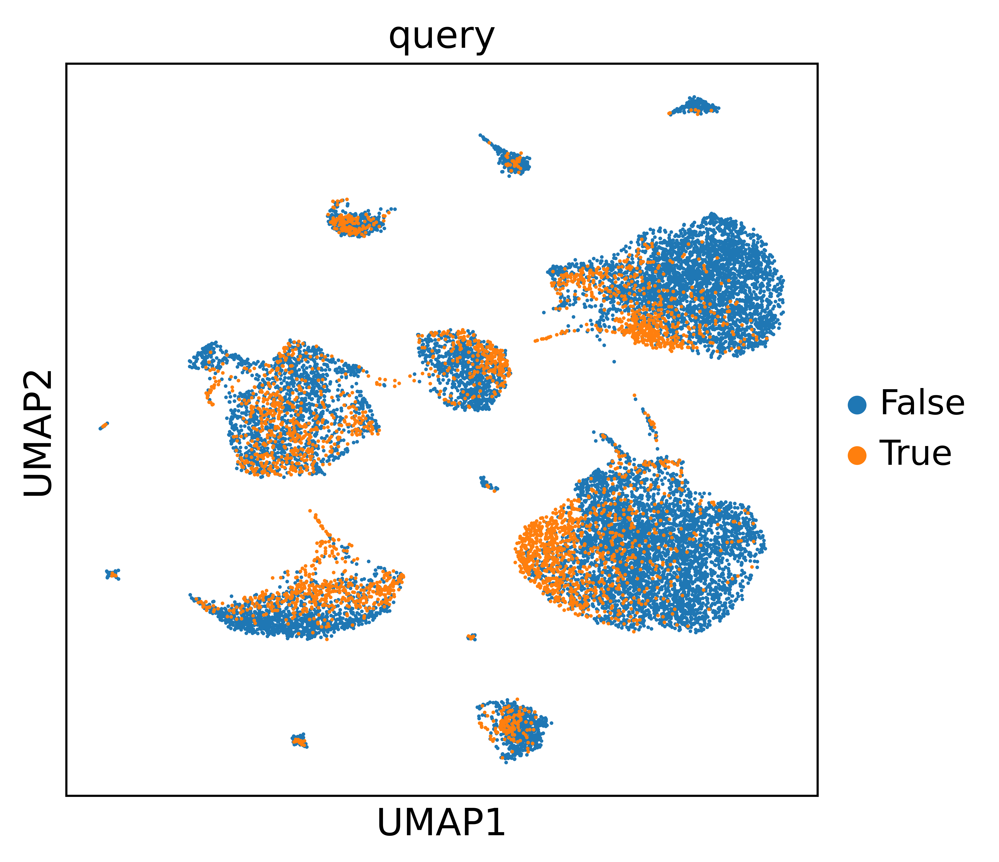

In [46]:
data_latent = lataq_query.get_latent(
    adata.X, 
    adata.obs[condition_key].values
)
adata_latent = sc.AnnData(data_latent)
adata_latent.obs['batch'] = adata.obs[condition_key].tolist()
results_dict = lataq_query.classify(
    adata.X, 
    adata.obs[condition_key], 
    metric='dist'
)
print(results_dict)
sc.pp.neighbors(adata_latent)
sc.tl.umap(adata_latent)
sc.pl.umap(adata_latent, color='batch')
adata_latent.obs = adata.obs
sc.pl.umap(adata_latent, color='query')

In [47]:
from lataq_reproduce.utils import label_encoder
conditions, _ = label_encoder(adata, condition_key=condition_key)
labels, _ = label_encoder(adata, condition_key=cell_type_key[0])
adata.obs["batch_test"] = conditions.squeeze(axis=1)
adata.obs["celltype_test"] = labels.squeeze(axis=1)
adata.obs["batch_test"] = adata.obs["batch_test"].astype("category")
adata.obs["celltype_test"] = adata.obs["celltype_test"].astype("category")

conditions, _ = label_encoder(adata_latent, condition_key=condition_key)
labels, _ = label_encoder(adata_latent, condition_key=cell_type_key[0])
adata_latent.obs["batch_test"] = conditions.squeeze(axis=1)
adata_latent.obs["celltype_test"] = labels.squeeze(axis=1)
adata_latent.obs["batch_test"] = adata_latent.obs["batch_test"].astype("category")
adata_latent.obs["celltype_test"] = adata_latent.obs["celltype_test"].astype("category")
sc.pp.pca(adata)
sc.pp.pca(adata_latent)

In [ ]:
from scIB.metrics import metrics
scores = metrics(
        adata,
        adata_latent,
        "batch_test",
        "celltype_test",
        isolated_labels_asw_=True,
        silhouette_=True,
        graph_conn_=True,
        pcr_=True,
        isolated_labels_f1_=True,
        nmi_=True,
        ari_=True,
    )

scores = scores.T
scores = scores[
    [
        "NMI_cluster/label",
        "ARI_cluster/label",
        "ASW_label",
        "ASW_label/batch",
        "PCR_batch",
        "isolated_label_F1",
        "isolated_label_silhouette",
        "graph_conn",
    ]
]

NMI...
ARI...
Silhouette score...
PC regression...
Isolated labels F1...
Isolated labels ASW...


In [ ]:
scores.mean()

In [ ]:
results_dict = lataq_query.classify(
    target_adata.X, 
    target_adata.obs[condition_key], 
    metric=PARAMS['LABELED_LOSS_METRIC'],
)
for i in range(len(cell_type_key)):
    preds = results_dict[cell_type_key[i]]['preds']
    probs = results_dict[cell_type_key[i]]['probs']
    classification_df = pd.DataFrame(
        classification_report(
            y_true=target_adata.obs[cell_type_key[i]], 
            y_pred=preds,
            output_dict=True
        )
    ).transpose()

In [ ]:
np.linalg.norm(np.random.normal(size=100))

In [ ]:
classification_df

In [27]:
checks = np.array(len(target_adata) * ["incorrect"])
checks[preds == target_adata.obs[cell_type_key[0]]] = "correct"

In [28]:
data_latent = lataq_query.get_latent(
    target_adata.X, 
    target_adata.obs[condition_key].values
)
adata_latent_query = sc.AnnData(data_latent)
adata_latent_query.obs = target_adata.obs
adata_latent_query.obs['clf_correct'] = checks

In [29]:
sc.pp.neighbors(adata_latent_query)
sc.tl.umap(adata_latent_query)

... storing 'clf_correct' as categorical


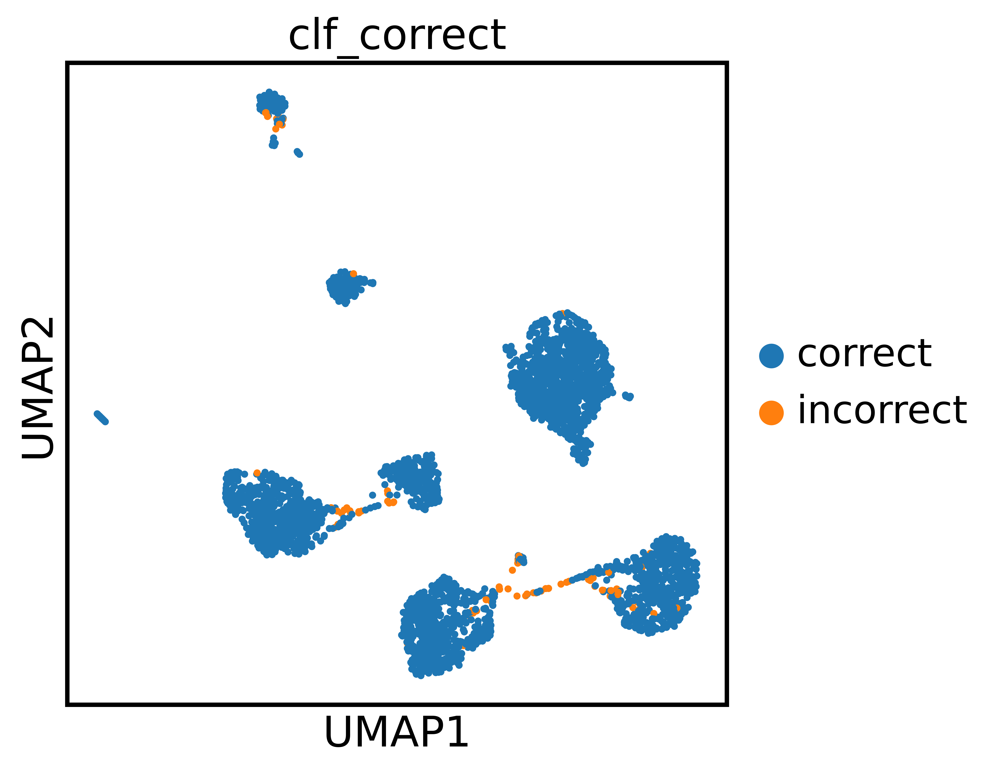

In [30]:
sc.pl.umap(adata_latent_query, color='clf_correct')